# Inspecting figures

In [1]:
!python --version

Python 3.6.1 :: Continuum Analytics, Inc.


See summary in [gsheets](https://docs.google.com/spreadsheets/d/1GfK-UxlUjHU5QXJFH34JvAi-tP55wixRCspxAnLVabU/edit#gid=1374274280)

In [2]:
import pandas as pd

df=pd.read_csv('../c10-candidate.csv',index_col=0)
df.head()

,epic,ra,dec
0,201092629,181.239357,-6.804924
1,201102594,179.835908,-6.517851
2,201110617,182.700187,-6.294205
3,201111557,183.846543,-6.268236
4,201127519,181.372066,-5.848084


In [3]:
aper = {'201091593': 14.328,
 '201092629': 20.696,
 '201102594': 15.123999999999999,
 '201110617': 15.92,
 '201111557': 17.512,
 '201127519': 10.348,
 '201128338': 18.308,
 '201132684': 21.492,
 '201164625': 19.104,
 '201166680': 22.288,
 '201180665': 8.756,
 '201211526': 13.532,
 '201225286': 12.736,
 '201274010': 16.716,
 '201299088': 23.084,
 '201352100': 10.348,
 '201357643': 6.368,
 '201386739': 16.716,
 '201390048': 10.348,
 '201390927': 14.328,
 '201392505': 7.96,
 '201437844': 31.84,
 '201595106': 17.512,
 '201598502': 15.123999999999999,
 '201615463': 16.716,
 '228707509': 14.328,
 '228720681': 10.348,
 '228721452': 14.328,
 '228724899': 11.144,
 '228725791': 11.94,
 '228725972': 14.328,
 '228729473': 19.104,
 '228732031': 21.492,
 '228734900': 15.92,
 '228735255': 16.716,
 '228736155': 15.123999999999999,
 '228739306': 15.123999999999999,
 '228748383': 15.92,
 '228748826': 15.123999999999999,
 '228753871': 13.532,
 '228758778': 12.736,
 '228758948': 17.512,
 '228763938': 14.328,
 '228784812': 8.756,
 '228798746': 9.552,
 '228801451': 18.308,
 '228804845': 19.104,
 '228809391': 9.552,
 '228809550': 11.144,
 '228834632': 11.94,
 '228836835': 7.96,
 '228846243': 9.552,
 '228849382': 7.96,
 '228888935': 8.756,
 '228894622': 12.736,
 '228934525': 9.552,
 '228964773': 7.164,
 '228968232': 10.348,
 '228974324': 11.94,
 '228974907': 32.635999999999996,
 '229004835': 11.144,
 '229017395': 15.92,
 '229103251': 16.716,
 '229131722': 12.736,
 '229133720': 18.308}

In [4]:
import numpy as np

df2 = pd.Series(list(aper.values()), index=aper.keys())
df2.head()

201091593    14.328
201092629    20.696
201102594    15.124
201110617    15.920
201111557    17.512
dtype: float64

In [5]:
df.epic.unique() #.to_csv('unique-candidates.csv')

array([201092629, 201102594, 201110617, 201111557, 201127519, 201128338,
       201132684, 201164625, 201166680, 201180665, 201211526, 201225286,
       201274010, 201352100, 201357643, 201386739, 201390048, 201390927,
       201392505, 201437844, 201595106, 201598502, 201615463, 228707509,
       228720681, 228721452, 228724899, 228725791, 228725972, 228729473,
       228732031, 228734900, 228735255, 228736155, 228739306, 228748383,
       228748826, 228753871, 228758778, 228758948, 228763938, 228784812,
       228798746, 228801451, 228804845, 228809391, 228809550, 228834632,
       228836835, 228846243, 228849382, 228888935, 228894622, 228934525,
       228964773, 228968232, 228974324, 228974907, 229004835, 229017395,
       229103251, 229131722, 229133720])

Test image

In [9]:
from glob import glob
from astropy.io import fits
from astropy.visualization import ZScaleInterval


epic = 201357643
foldername = str(epic)+'_grizy'
datadir = '../data/'

file_list=glob(datadir+foldername+'/*.fits')
file_list.sort()
print(file_list)

['../data/201357643_grizy/stack_g_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits', '../data/201357643_grizy/stack_i_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits', '../data/201357643_grizy/stack_r_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits', '../data/201357643_grizy/stack_y_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits', '../data/201357643_grizy/stack_z_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits']


In [10]:
hdulist=fits.open(file_list[0])
img=hdulist[0].data
hdr=hdulist[0].header['HIERARCH FPA.FILTER']
band = hdr.split('.')[0]

In [12]:
#arcsec/pix
pix_size = 60.0/img.shape[0]

In [13]:
img.shape

(240, 240)

In [14]:
pix_size

0.25

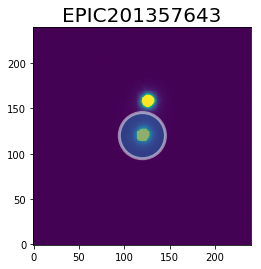

In [16]:
import matplotlib.pyplot as pl
%matplotlib inline

interval = ZScaleInterval()
zmin,zmax = interval.get_limits(img)

fig, ax = pl.subplots()

x, y = img.shape[0]/2, img.shape[0]/2
ax.imshow(img,origin='bottom',vmin=zmin, vmax=zmax*100)
ax.set_title('EPIC{}'.format(epic),fontsize=20)
rad = df2.loc[str(epic)]/pix_size
circ = pl.Circle((x,y), rad, linewidth=3, alpha=0.5, edgecolor='w')
ax.add_artist(circ)

In [17]:
pl.Circle((x,y), rad, color='r', linewidth=10)

## 1'x1' g-r-i-z-y images

In [12]:
file_list.sort()

In [13]:
sorted(file_list)

['201357643_grizy/stack_g_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 '201357643_grizy/stack_i_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 '201357643_grizy/stack_r_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 '201357643_grizy/stack_y_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 '201357643_grizy/stack_z_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits']

In [18]:
import matplotlib.pyplot as pl
%matplotlib inline

def mypattern(xlist):
    '''sort into grizy'''
    d = {}
    for i in xlist:
        ii = i.split('_')[2]
        if ii =='g':
            d[1] = i 
        elif ii=='r':
            d[2] = i
        elif ii=='i':
            d[3] = i
        elif ii=='z':
            d[4] = i
        else:
            d[5] = i
    return d

In [19]:
mypattern(file_list)

{1: '../data/201357643_grizy/stack_g_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 2: '../data/201357643_grizy/stack_r_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 3: '../data/201357643_grizy/stack_i_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 4: '../data/201357643_grizy/stack_z_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits',
 5: '../data/201357643_grizy/stack_y_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits'}

In [20]:
d=mypattern(file_list)
['{}\n'.format(d[i]) for i in sorted(d)]

['../data/201357643_grizy/stack_g_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits\n',
 '../data/201357643_grizy/stack_r_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits\n',
 '../data/201357643_grizy/stack_i_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits\n',
 '../data/201357643_grizy/stack_z_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits\n',
 '../data/201357643_grizy/stack_y_ra185.181680_dec-1.590889_arcsec60_skycell1278.062.fits\n']

In [38]:
from glob import glob
from astropy.io import fits
from astropy.visualization import ZScaleInterval
from photutils import centroid_com

filters = 'grizy'

interval = ZScaleInterval()

def showfig(first,last, recenter=False, x=120, y=120, contrast=50):
    ncols = 5 #5 bands
    nrows = last-first
    fig, ax = pl.subplots(nrows,ncols,figsize=(15,15))

    for m,epic in enumerate(df.epic.unique()[first:last]):
        foldername = str(epic)+'_'+str(filters)
        file_list=glob(datadir+foldername+'/*.fits')
        #order in grizy
        d = mypattern(file_list)
        file_list = [d[i] for i in sorted(d)]
        #print(file_list)

        for n,f in enumerate(file_list):
            #open fits file
            hdulist=fits.open(f)
            img = hdulist[0].data
            hdr=hdulist[0].header['HIERARCH FPA.FILTER']
            #get limits
            zmin,zmax = interval.get_limits(img)
            #get filter
            #band = f.split('/')[1].split('_')[1]
            band = hdr.split('.')[0]
            ax[m,n].imshow(img,origin='bottom',label=band, cmap='gray', vmin=zmin, vmax=zmax*contrast)
            ax[m,2].set_title('EPIC {}'.format(epic),fontsize=20)
            ax[m,n].yaxis.set_major_locator(pl.NullLocator())
            ax[m,n].xaxis.set_major_formatter(pl.NullFormatter())
            ax[m,n].text(20,30,band,fontsize=20,color='w')
            
            if recenter:
                x,y = centroid_com(img)
            rad = df2.loc[str(epic)]/pix_size
            circ = pl.Circle((x,y), rad, linewidth=3, alpha=0.5, edgecolor='w')
            ax[m,n].add_artist(circ)
    fig.tight_layout()

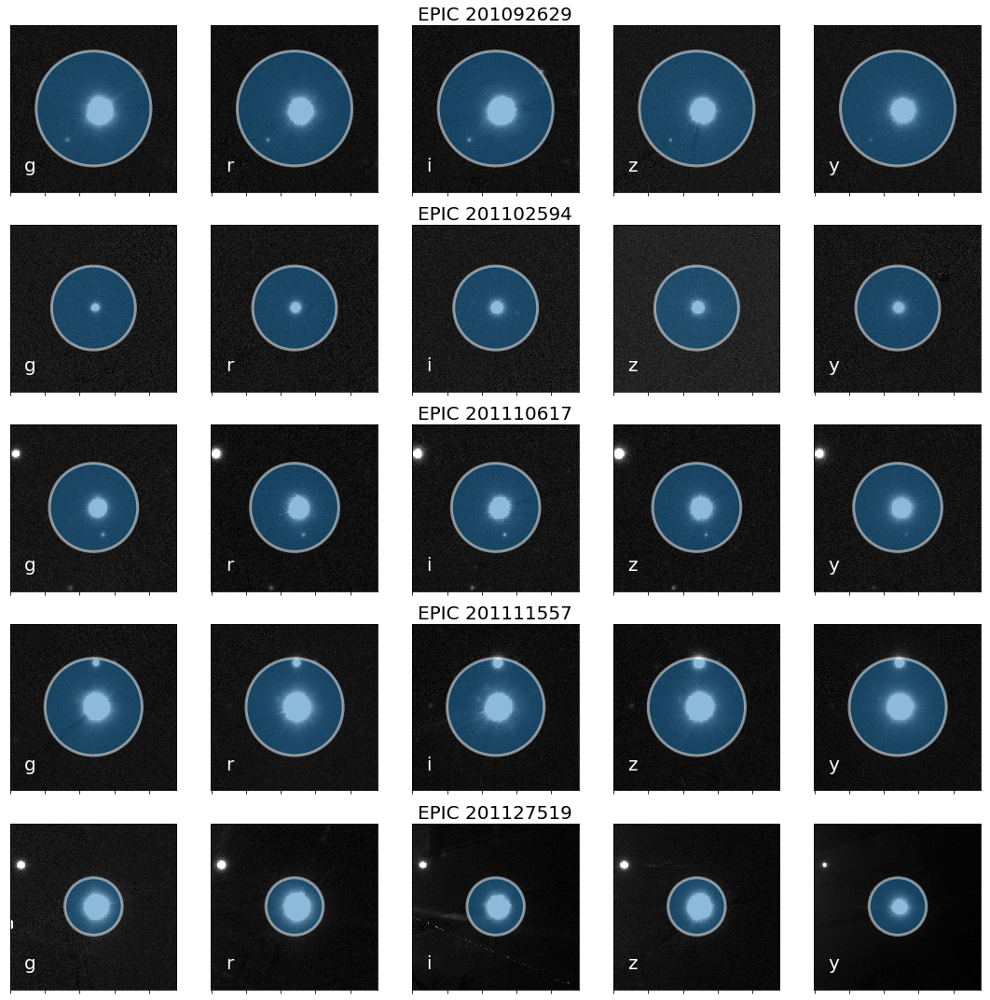

In [39]:
showfig(0,5,recenter=False, contrast=5)

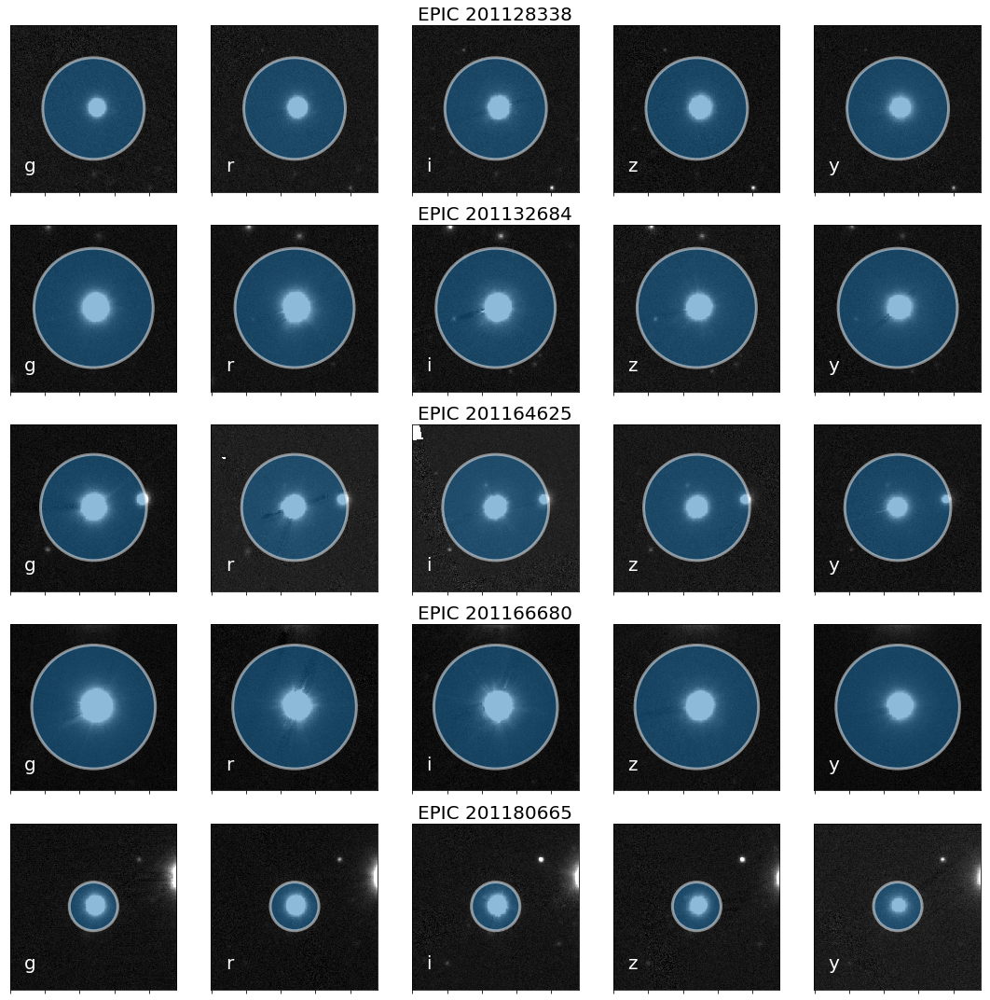

In [40]:
showfig(5,10,recenter=False, contrast=5)

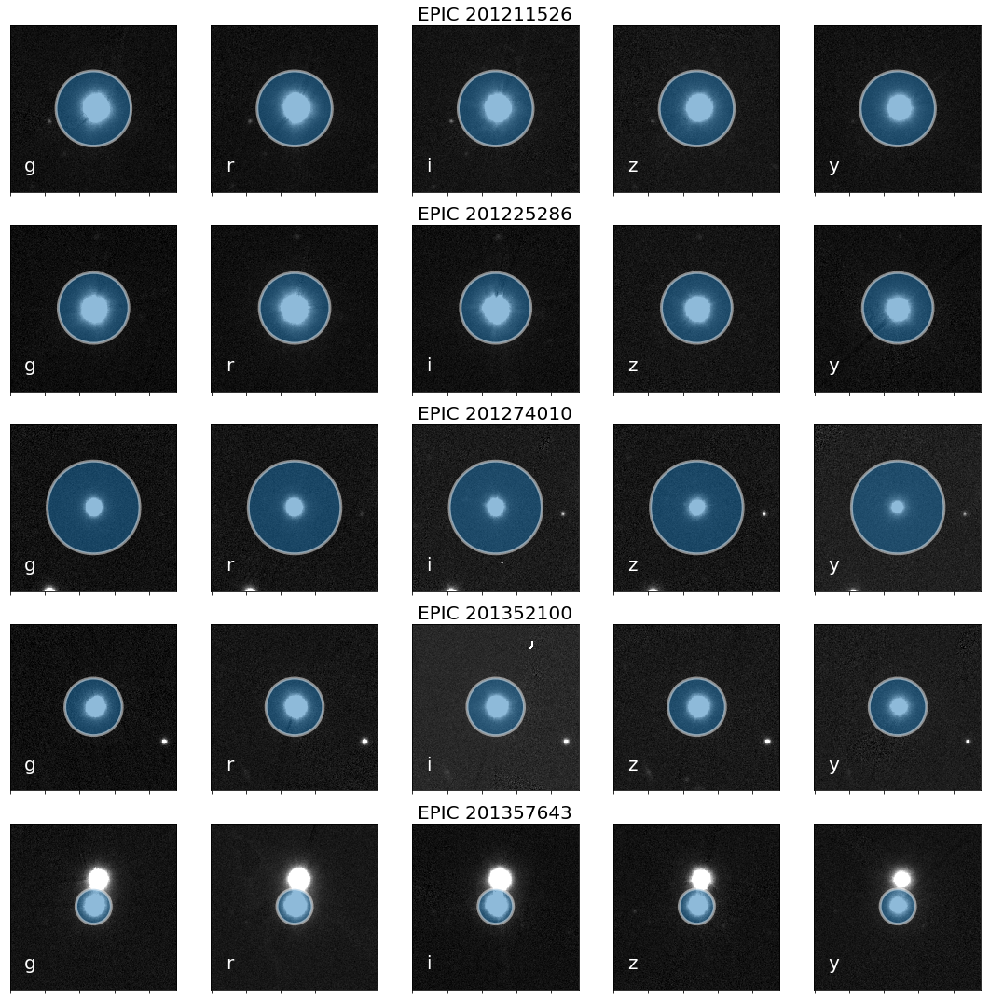

In [41]:
showfig(10,15,recenter=False, contrast=5)

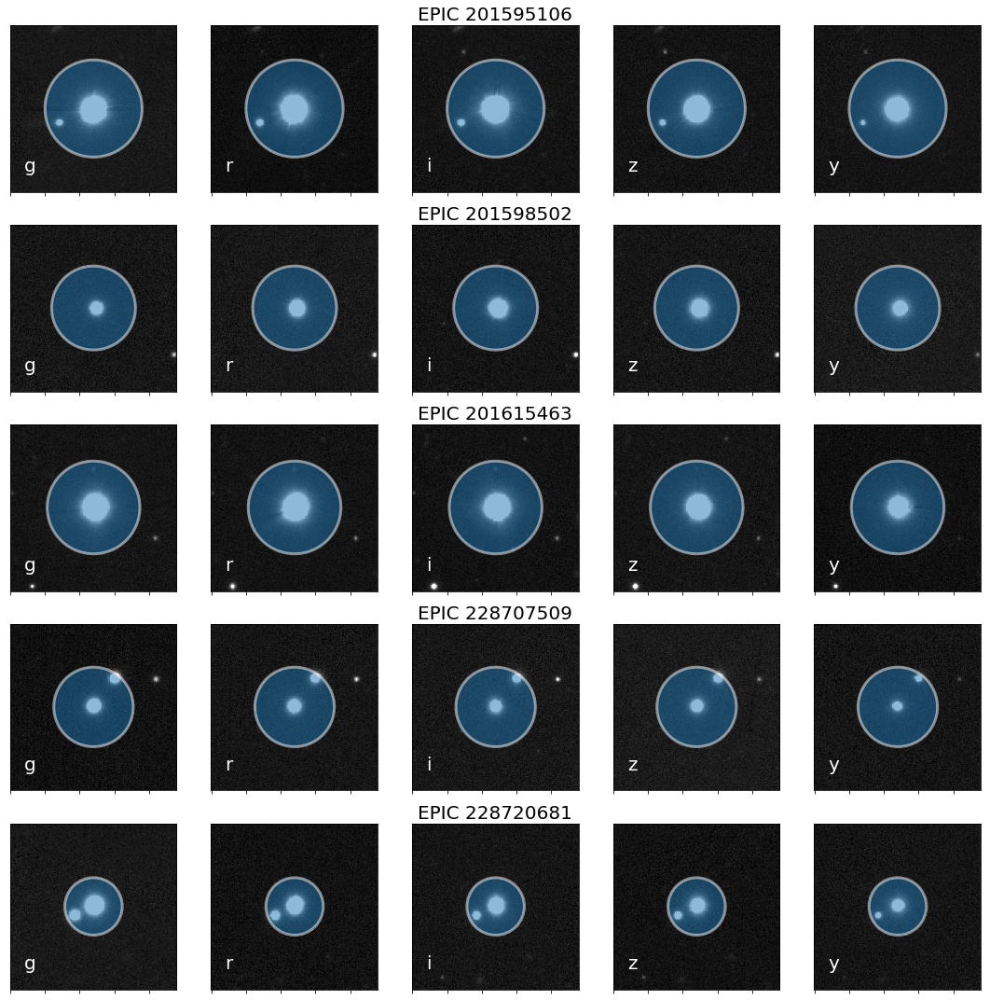

In [42]:
showfig(20,25,recenter=False, contrast=5)

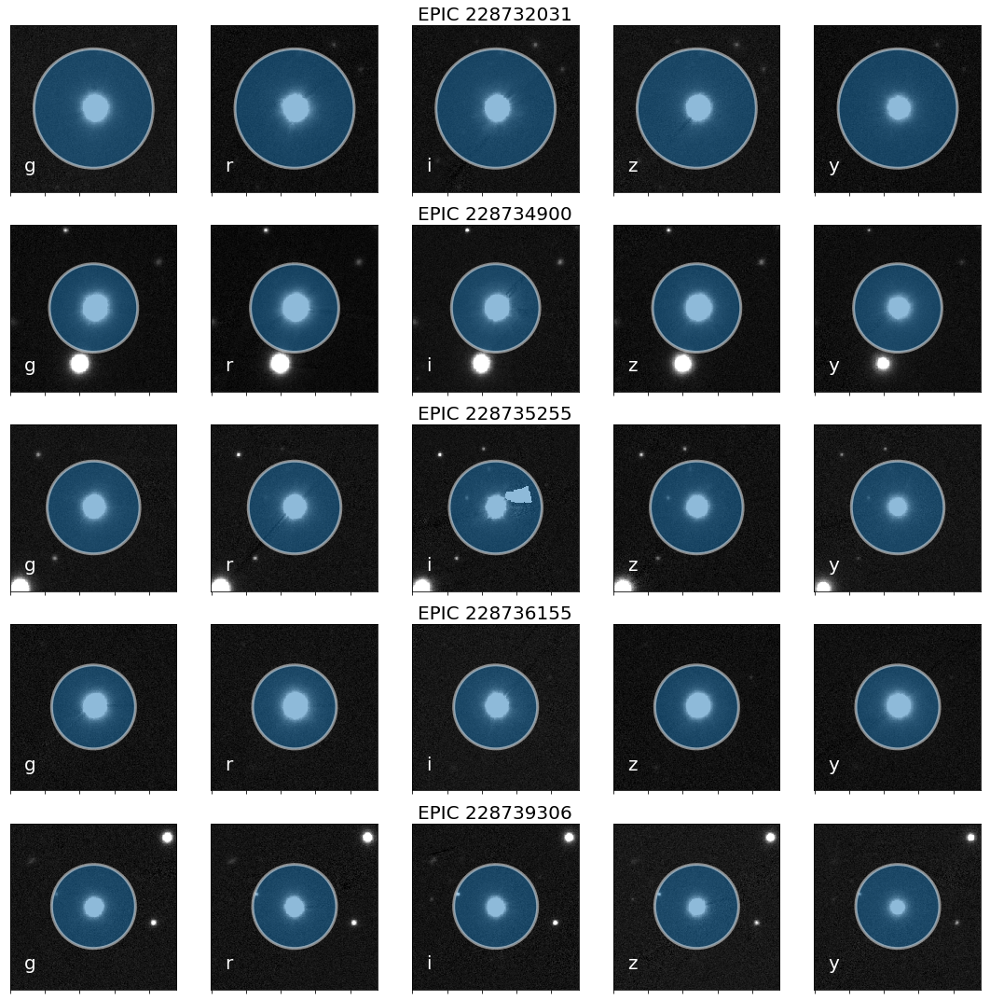

In [43]:
showfig(30,35,recenter=False, contrast=5)

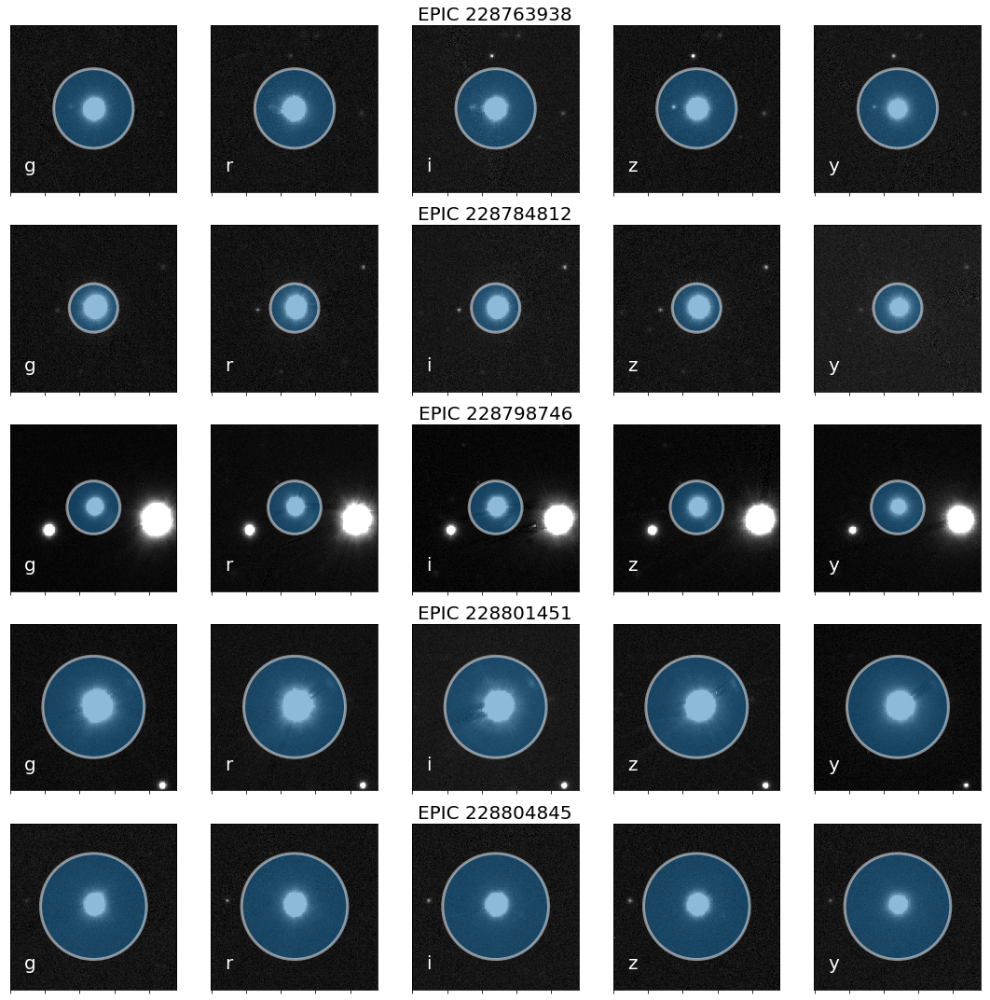

In [44]:
showfig(40,45,recenter=False, contrast=5)

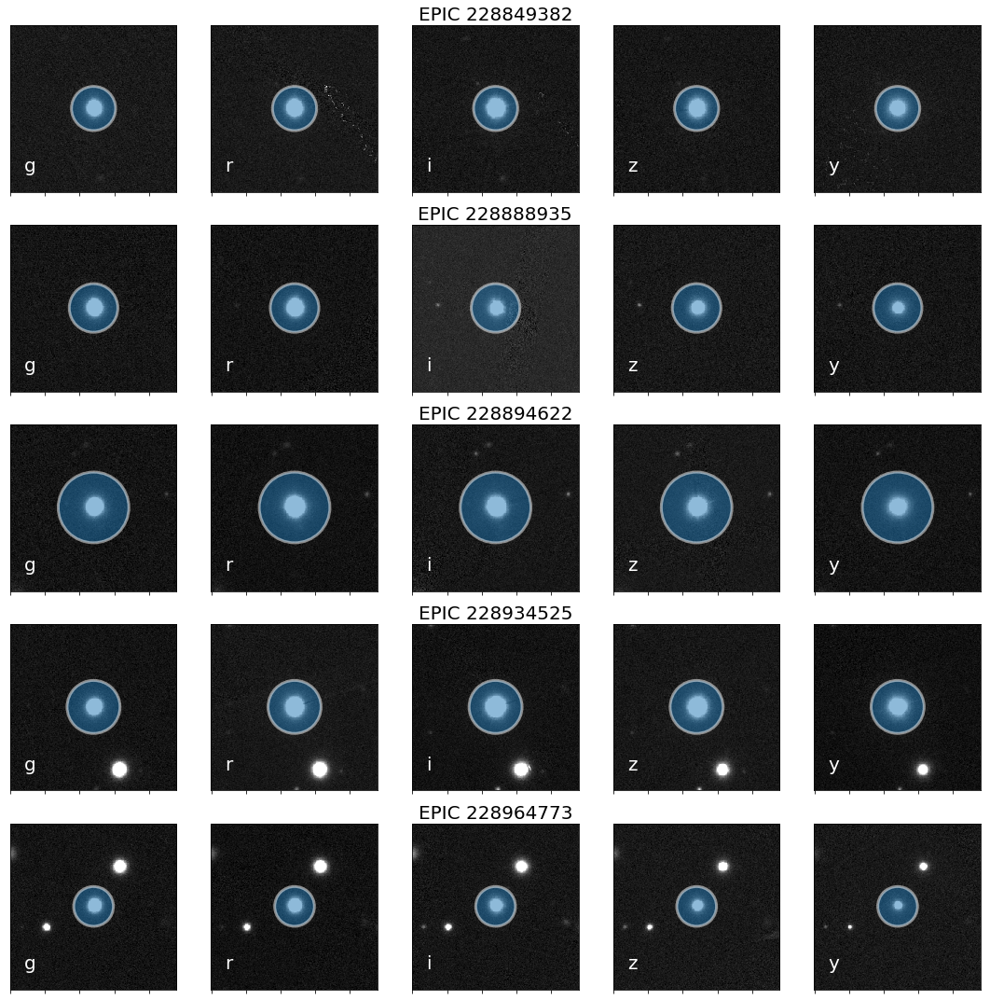

In [45]:
showfig(50,55,recenter=False, contrast=5)

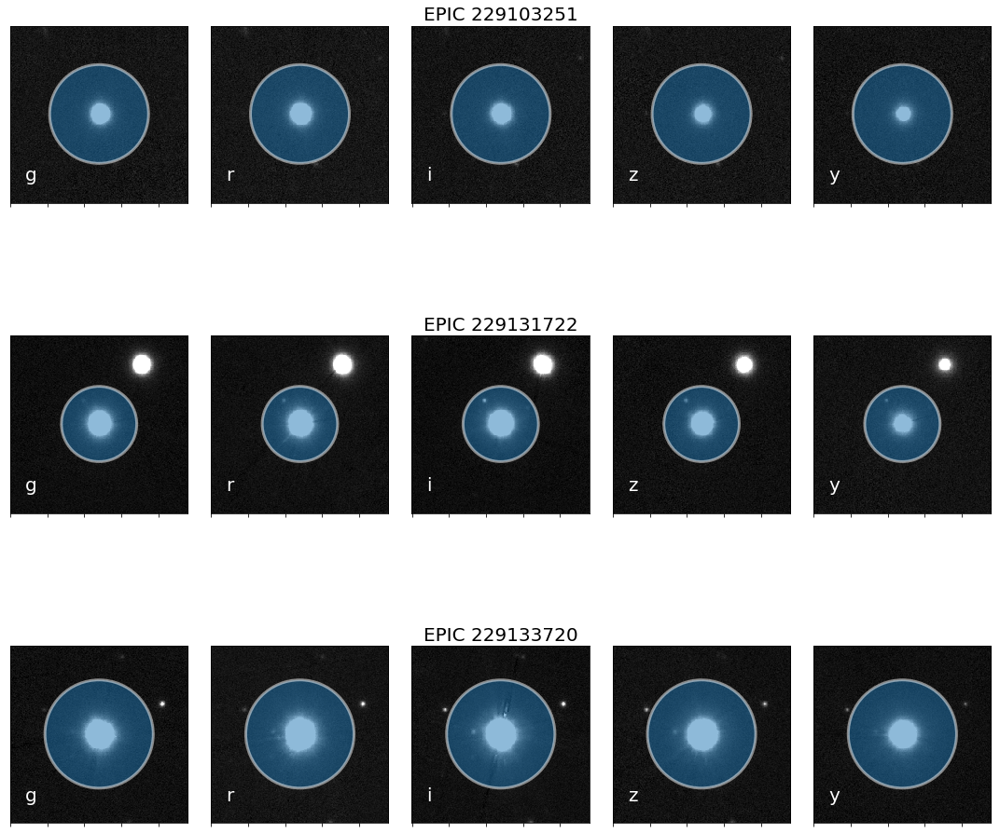

In [46]:
showfig(60,63,recenter=False, contrast=5)

## Selected

In [47]:
def parse_kwargs(kwargs):
    if kwargs is not None:
        textloc=kwargs['textloc']
        fontsize=kwargs['fontsize']
        pad=kwargs['pad']
    else:
        textloc, fontsize = (30,30), 20, 0
    
    return textloc, fontsize, pad

def showfig_selected(ids, contrast=5, figsize=(8.27,11.69), kwargs=None):
    textloc, fontsize, pad = parse_kwargs(kwargs)
        
    row = len(ids)
    fig, ax = pl.subplots(row,5,figsize=figsize)

    for m,epic in enumerate(ids):
        foldername = str(epic)+'_'+str(filters)
        file_list=glob(datadir+foldername+'/*.fits')

        d = mypattern(file_list)
        file_list = [d[i] for i in sorted(d)]
        #print(file_list)

        for n,f in enumerate(file_list):
            #open fits file
            hdulist=fits.open(f)
            img = hdulist[0].data
            hdr=hdulist[0].header['HIERARCH FPA.FILTER']
            #get limits
            zmin,zmax = interval.get_limits(img)
            #get filter
            #band = f.split('/')[1].split('_')[1]
            band = hdr.split('.')[0]
            ax[m,n].imshow(img,origin='bottom',label='${}$'.format(band), 
                           cmap='gray', vmin=zmin, vmax=zmax*contrast)
            ax[m,2].set_title('{}'.format(epic),fontsize=fontsize, pad=pad)
            ax[m,n].yaxis.set_major_locator(pl.NullLocator())
            ax[m,n].xaxis.set_major_formatter(pl.NullFormatter())
            ax[m,n].text(*textloc,band,fontsize=fontsize,color='w')
            rad = df2.loc[str(epic)]/pix_size
            circ = pl.Circle((x,y), rad, linewidth=2, alpha=0.4, edgecolor='w')
            ax[m,n].add_artist(circ)
    #fig.tight_layout()
    return fig

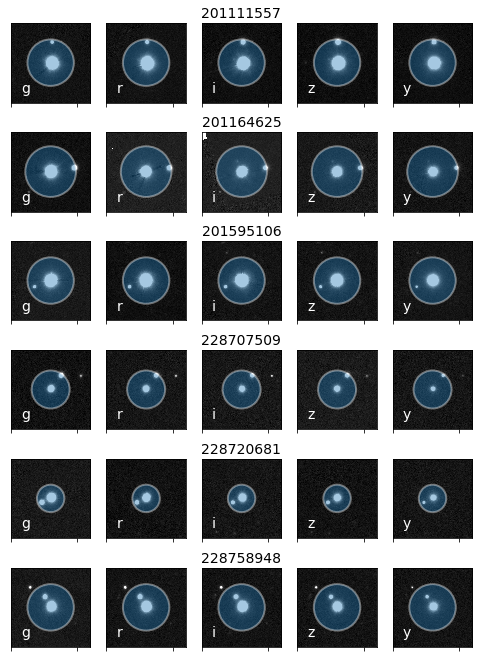

In [48]:
#selected_ids = sorted([228707509,201164625,201111557,228720681,201357643,228734900])
selected_ids = [201111557, 201164625, 201595106, 228707509, 228720681, 228758948]

kwargs = {'textloc':(30,30),'fontsize':14, 'pad': 5}

fig = showfig_selected(selected_ids, contrast=5, figsize=(8.27,11.69), kwargs=kwargs)

In [49]:
fig.savefig('k2_pan-starrs.pdf',fmt='pdf',bbox_inches = 'tight')

In [50]:
fig.savefig('k2_pan-starrs.png',fmt='png',bbox_inches = 'tight')

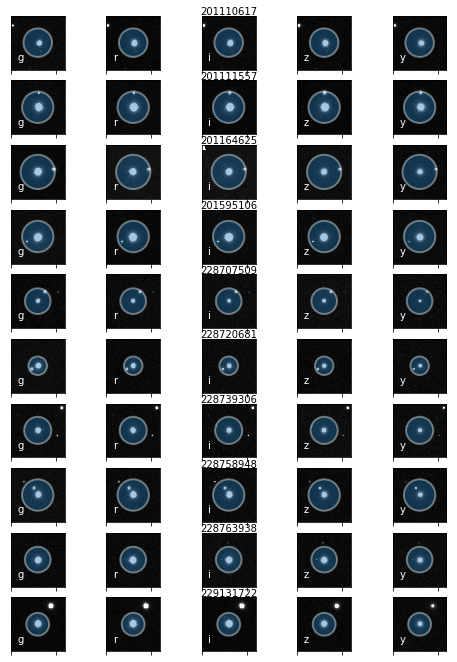

In [51]:
selected_ids_all = [201110617,201111557,201164625,201595106,228707509,228720681,228739306,228758948,228763938,229131722]

kwargs = {'textloc':(30,40),'fontsize':10, 'pad': 1}
fig = showfig_selected(selected_ids_all, contrast=10, figsize=(8.27,11.69), kwargs=kwargs)

In [52]:
fig.savefig('k2_pan-starrs_all.pdf',fmt='pdf',bbox_inches = 'tight')

In [53]:
fig.savefig('k2_pan-starrs_all.png',fmt='png',bbox_inches = 'tight')

In [58]:
def showfig_selected2(ids, contrast=10, figsize=(8.27,11.69), kwargs=None):
    textloc, fontsize, pad = parse_kwargs(kwargs)
    
    row = len(ids)
    fig, ax = pl.subplots(row,6,figsize=figsize)

    for m,epic in enumerate(ids):
        foldername = str(epic)+'_'+str(filters)
        file_list=glob(datadir+foldername+'/*.fits')

        d = mypattern(file_list)
        file_list = [d[i] for i in sorted(d)]
        #print(file_list)

        for n,f in enumerate(file_list):
            #left most column: epic number
            ax[m,0].text(0,0.5,epic,fontsize=fontsize)
            ax[m,0].axis('off')
            n+=1
            #open fits file
            hdulist=fits.open(f)
            img = hdulist[0].data
            hdr=hdulist[0].header['HIERARCH FPA.FILTER']
            #get limits
            zmin,zmax = interval.get_limits(img)
            #get filter
            #band = f.split('/')[1].split('_')[1]
            band = hdr.split('.')[0]
            ax[m,n].imshow(img,origin='bottom',label='${}$'.format(band), 
                           cmap='gray', vmin=zmin, vmax=zmax*contrast)
            #ax[m,2].set_title('{}'.format(epic),fontsize=fontsize)
            ax[m,n].yaxis.set_major_locator(pl.NullLocator())
            ax[m,n].xaxis.set_major_formatter(pl.NullFormatter())
            ax[m,n].text(*textloc,band,fontsize=fontsize,color='w')
            rad = df2.loc[str(epic)]/pix_size
            circ = pl.Circle((x,y), rad, linewidth=2, alpha=0.4, edgecolor='w')
            ax[m,n].add_artist(circ)
    #fig.tight_layout()
    return fig

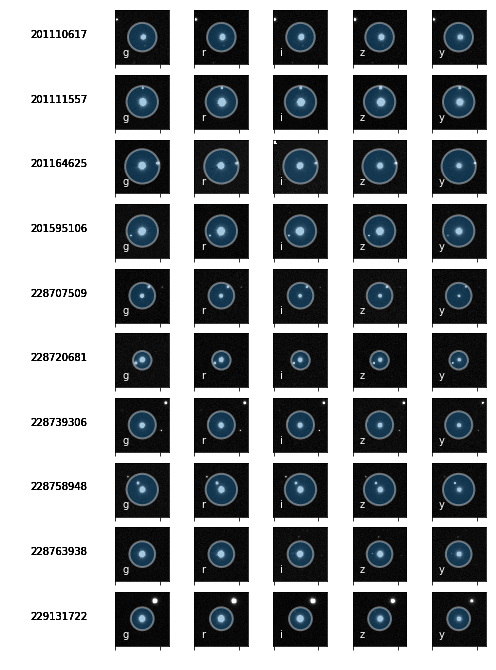

In [59]:
kwargs = {'textloc':(30,40),'fontsize':10, 'pad': 1}
fig = showfig_selected2(selected_ids_all, contrast=10, figsize=(8.27,11.69), kwargs=kwargs)

In [60]:
fig.savefig('k2_pan-starrs_all2.pdf',fmt='pdf',bbox_inches = 'tight')

In [61]:
fig.savefig('k2_pan-starrs_all2.png',fmt='png',bbox_inches = 'tight')